In [22]:
import pandas as pd 
import numpy as np

In [23]:
df = pd.read_csv('housing_price_dataset.csv')

In [24]:
df

,SquareFeet,Bedrooms,Bathrooms,Neighborhood,YearBuilt,Price
0,2126,4,1,Rural,1969,215355.283618
1,2459,3,2,Rural,1980,195014.221626
2,1860,2,1,Suburb,1970,306891.012076
3,2294,2,1,Urban,1996,206786.787153
4,2130,5,2,Suburb,2001,272436.239065
...,...,...,...,...,...,...
49995,1282,5,3,Rural,1975,100080.865895
49996,2854,2,2,Suburb,1988,374507.656727
49997,2979,5,3,Suburb,1962,384110.555590
49998,2596,5,2,Rural,1984,380512.685957


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   SquareFeet    50000 non-null  int64  
 1   Bedrooms      50000 non-null  int64  
 2   Bathrooms     50000 non-null  int64  
 3   Neighborhood  50000 non-null  object 
 4   YearBuilt     50000 non-null  int64  
 5   Price         50000 non-null  float64
dtypes: float64(1), int64(4), object(1)
memory usage: 2.3+ MB


In [26]:
df.isnull().sum()

SquareFeet      0
Bedrooms        0
Bathrooms       0
Neighborhood    0
YearBuilt       0
Price           0
dtype: int64

In [27]:
import seaborn as sns
import plotly.express as px


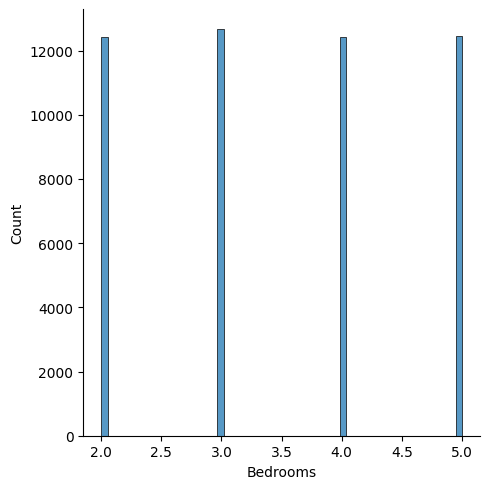

In [28]:
sns.displot(df, x="Bedrooms")

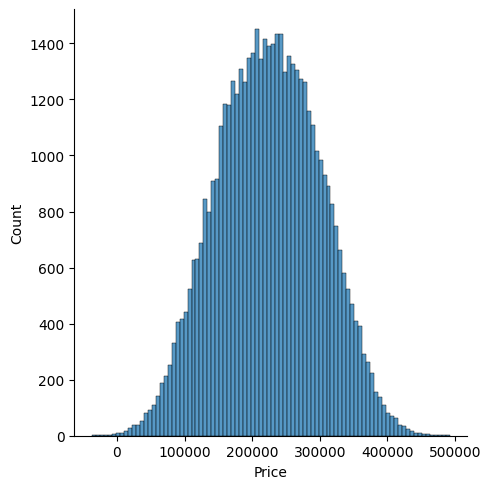

In [29]:
sns.displot(df, x="Price")

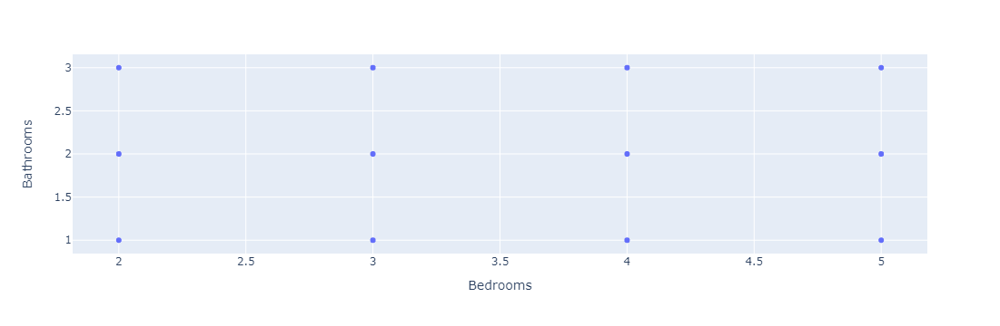

In [30]:
fig = px.scatter(df, x="Bedrooms", y="Bathrooms")
fig.show()

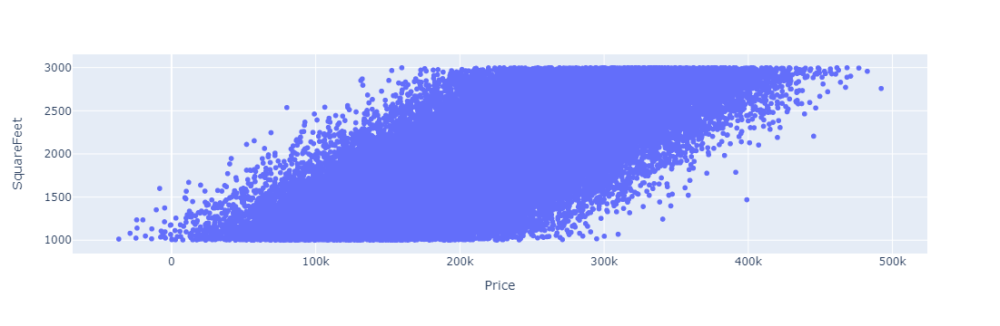

In [31]:
fig = px.scatter(df, x="Price", y="SquareFeet")
fig.show()

In [32]:
Neigh = df.groupby('Neighborhood')

In [33]:
Neigh.mean()

,SquareFeet,Bedrooms,Bathrooms,YearBuilt,Price
Neighborhood,,,,,
Rural,2001.621132,3.506836,1.991185,1985.353262,224096.126040
Suburb,2000.151127,3.493930,2.000658,1985.515280,223234.189857
Urban,2017.416913,3.495332,1.994399,1985.344155,227166.197139


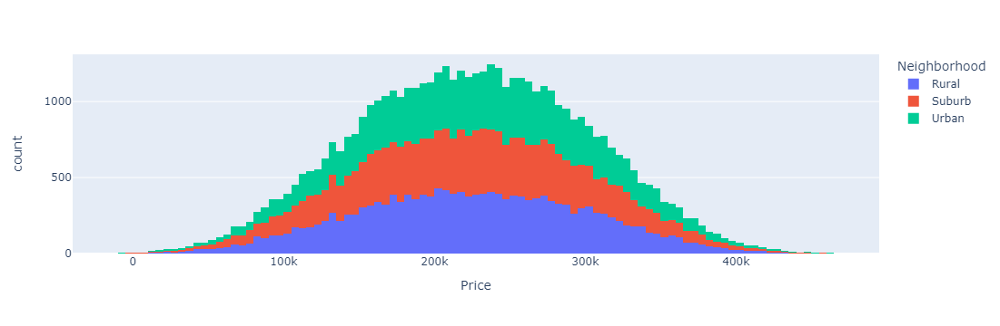

In [34]:
fig = px.histogram(df, x="Price", color="Neighborhood")
fig.show()

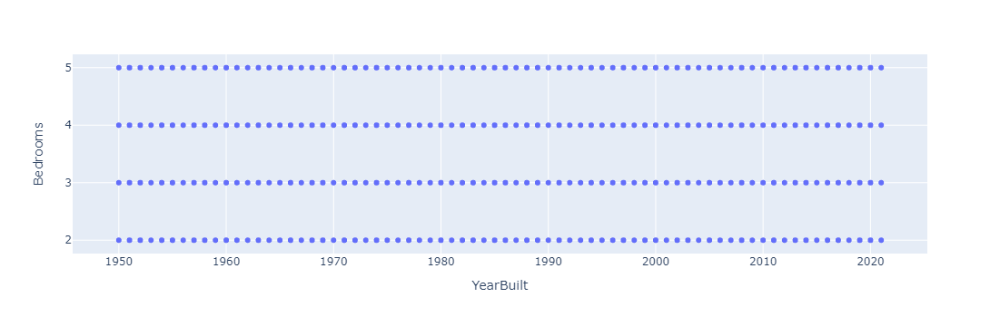

In [35]:
fig = px.scatter(df, x="YearBuilt", y = 'Bedrooms')
fig.show()

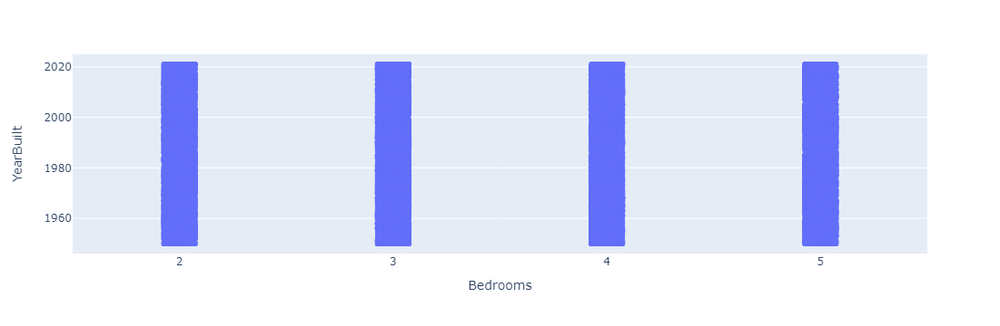

In [36]:
fig = px.strip(df, x="Bedrooms", y="YearBuilt")
fig.show()

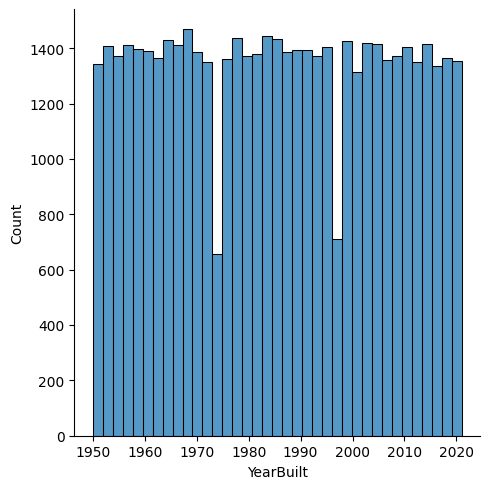

In [37]:
sns.displot(df, x="YearBuilt")

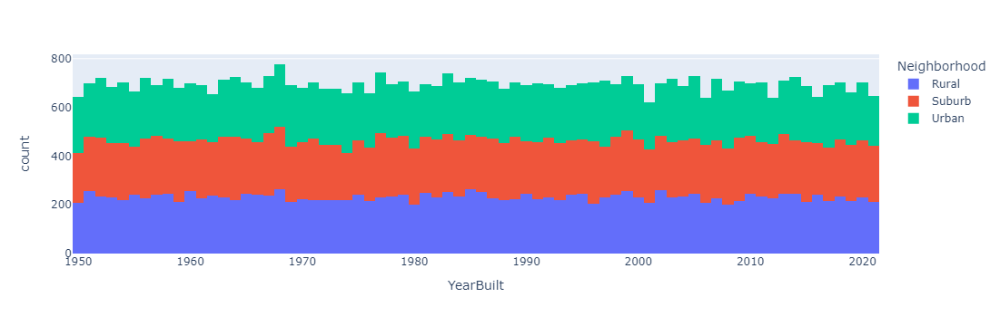

In [38]:
fig = px.histogram(df, x="YearBuilt", color = 'Neighborhood')
fig.show()

X Y

ONE HOT ENCODING 

TRAIN TEST SPLIT

FIT 

PREDICTION

TRA

In [39]:
Y = df['Price']
Y

0        215355.283618
1        195014.221626
2        306891.012076
3        206786.787153
4        272436.239065
             ...      
49995    100080.865895
49996    374507.656727
49997    384110.555590
49998    380512.685957
49999    221618.583218
Name: Price, Length: 50000, dtype: float64

In [49]:
X = df.drop('Price', axis = 1)
X

,SquareFeet,Bedrooms,Bathrooms,Neighborhood,YearBuilt
0,2126,4,1,Rural,1969
1,2459,3,2,Rural,1980
2,1860,2,1,Suburb,1970
3,2294,2,1,Urban,1996
4,2130,5,2,Suburb,2001
...,...,...,...,...,...
49995,1282,5,3,Rural,1975
49996,2854,2,2,Suburb,1988
49997,2979,5,3,Suburb,1962
49998,2596,5,2,Rural,1984


In [50]:
X = pd.get_dummies(X, columns= ['Neighborhood'], dtype=int )
X


,SquareFeet,Bedrooms,Bathrooms,YearBuilt,Neighborhood_Rural,Neighborhood_Suburb,Neighborhood_Urban
0,2126,4,1,1969,1,0,0
1,2459,3,2,1980,1,0,0
2,1860,2,1,1970,0,1,0
3,2294,2,1,1996,0,0,1
4,2130,5,2,2001,0,1,0
...,...,...,...,...,...,...,...
49995,1282,5,3,1975,1,0,0
49996,2854,2,2,1988,0,1,0
49997,2979,5,3,1962,0,1,0
49998,2596,5,2,1984,1,0,0


In [51]:
from sklearn.model_selection import train_test_split



In [64]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size= 0.20, random_state= 35 ) 

In [65]:
X_train

,SquareFeet,Bedrooms,Bathrooms,YearBuilt,Neighborhood_Rural,Neighborhood_Suburb,Neighborhood_Urban
45204,1211,2,1,2019,1,0,0
35444,1391,3,3,1978,0,1,0
26511,1996,2,3,1962,0,0,1
40756,1636,2,1,1991,0,0,1
22880,2478,3,3,2017,1,0,0
...,...,...,...,...,...,...,...
15808,2091,2,2,1961,0,1,0
19391,2272,4,2,2012,0,0,1
48161,1504,2,1,2000,0,1,0
41911,2754,2,2,2019,1,0,0


In [66]:
X_test

,SquareFeet,Bedrooms,Bathrooms,YearBuilt,Neighborhood_Rural,Neighborhood_Suburb,Neighborhood_Urban
45663,2591,4,1,1950,1,0,0
46963,1773,3,3,1952,1,0,0
3742,2177,5,1,1962,0,1,0
38082,2883,2,1,2017,0,0,1
22570,1494,3,3,2011,0,1,0
...,...,...,...,...,...,...,...
2259,2770,4,1,1961,1,0,0
16312,1372,2,3,1984,0,1,0
16942,2110,5,1,2013,1,0,0
427,2158,5,1,1958,0,0,1


In [67]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [68]:
y_pred = model.predict(X_test)

In [69]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

In [70]:
test_mse = mean_squared_error(y_test, y_pred)
test_r2 = r2_score(y_test, y_pred)
test_mae = mean_absolute_error(y_test, y_pred)

In [71]:
test_mse

2464586430.16471

In [74]:
test_r2

0.5710953832891585

In [75]:
test_mae

39689.40123812309

In [76]:
model.coef_

array([ 9.95260731e+01,  5.17737881e+03,  3.02383352e+03, -3.64463757e+00,
       -3.56675612e+02, -8.61389956e+02,  1.21806557e+03])

In [77]:
from sklearn.linear_model import SGDRegressor

In [94]:
model2 = SGDRegressor(n_iter_no_change= 30)

In [95]:
model2.fit(X_train,y_train)

C:\Users\hacot\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1561: ConvergenceWarning:

Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.



SGDRegressor(n_iter_no_change=30)

In [96]:
y_pred2 = model2.predict(X_test)

In [97]:
test2_mse = mean_squared_error(y_test, y_pred2)
test2_r2 = r2_score(y_test, y_pred2)
test2_ma2e = mean_absolute_error(y_test, y_pred2)

In [98]:
test2_mse

6.573854696942259e+28

In [99]:
test2_r2

-1.1440283021100423e+19

In [100]:
test2_ma2e

214851786190008.03

In [101]:
from sklearn.ensemble import RandomForestRegressor



In [103]:
rf = RandomForestRegressor(max_depth= 3, random_state= 50)
rf.fit(X_train, y_train)

RandomForestRegressor(max_depth=3, random_state=50)

In [104]:
y_pred_rf = rf.predict(X_test)

In [105]:
testrf_mse = mean_squared_error(y_test, y_pred_rf)
testrf_r2 = r2_score(y_test, y_pred_rf)
testrf_mae = mean_absolute_error(y_test, y_pred_rf)

In [106]:
testrf_mse

2520313624.9369597

In [107]:
testrf_r2

0.5613973459951025

In [108]:
testrf_mae

40184.75451785939

In [109]:
import matplotlib.pyplot as plt

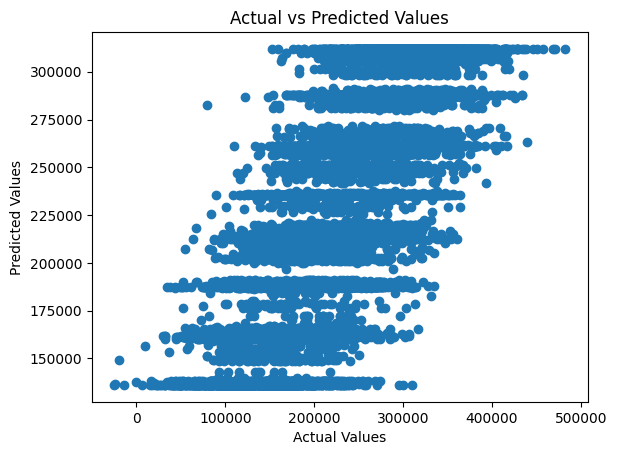

In [110]:

# Create scatter plot with actual and predicted values
plt.scatter(y_test, y_pred_rf)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In [112]:
plot.scatter(xTest, yTest, color = 'red')
plot.plot(xTrain, linearRegressor.predict(xTrain), color = 'blue')
plot.title('Salary vs Experience (Test set)')
plot.xlabel('Years of Experience')
plot.ylabel('Salary')
plot.show()

NameError: name 'plot' is not defined

C:\Users\hacot\AppData\Local\Temp\ipykernel_17372\2732544847.py:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\hacot\AppData\Local\Temp\ipykernel_17372\2732544847.py:8: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




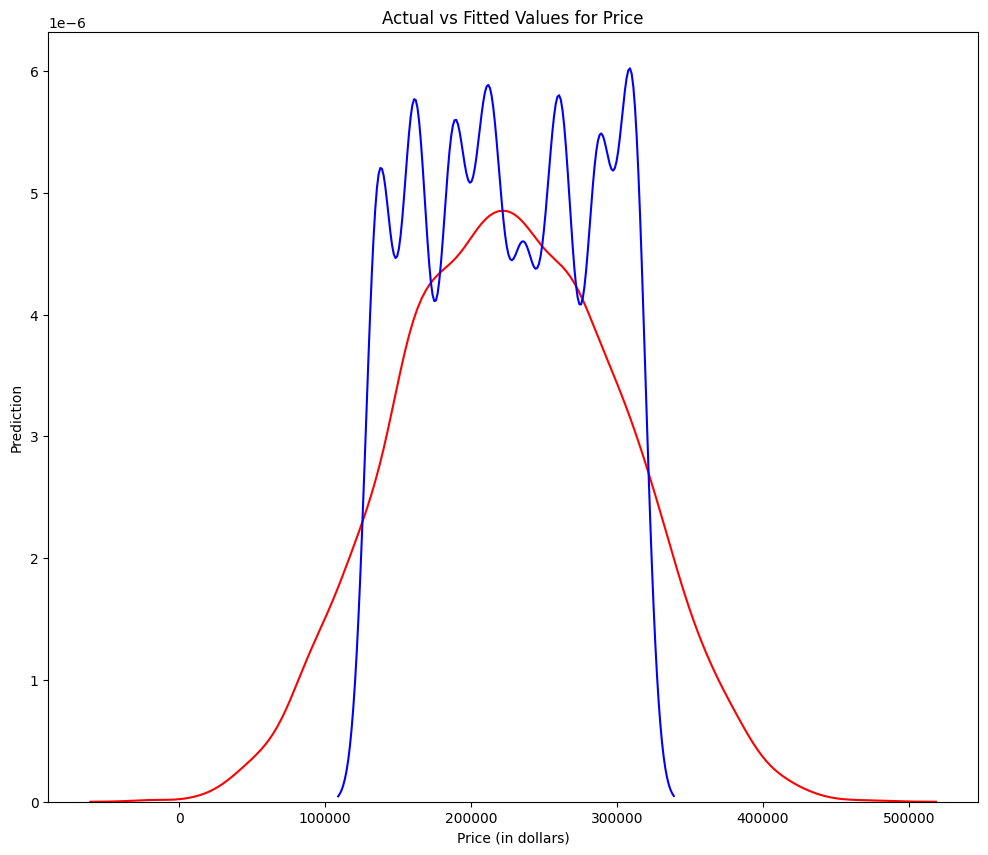

In [116]:
width = 12
height = 10

plt.figure(figsize=(width, height))


ax1 = sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred_rf, hist=False, color="b", label="Fitted Values" , ax=ax1)


plt.title('Actual vs Fitted Values for Price')
plt.xlabel('Price (in dollars)')
plt.ylabel('Prediction')

plt.show()
plt.close()